<a href="https://www.kaggle.com/code/muradpitafi/bank-s-customer-churn-lgbm-with-96-auc?scriptVersionId=154379510" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import numpy as np  
import pandas as pd  
 
import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))
        
import warnings 
warnings.filterwarnings('ignore')



<h1> Understanding the Data </h1>

In [2]:
banks = pd.read_csv("Churn_Modelling.csv")
banks.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [3]:
banks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [4]:
banks.isnull().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [5]:
banks.tail(5)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1
9999,10000,15628319,Walker,792,France,Female,28,4,130142.79,1,1,0,38190.78,0


<h1> Data Distribution of categorical and numerical variables </h1>

In [6]:
!pip3 install seaborn
import seaborn as sns

cat =  []
num = []
for i in banks.columns:
    if banks[i].nunique() < 12:
        cat.append(i)
    else:
        num.append(i)

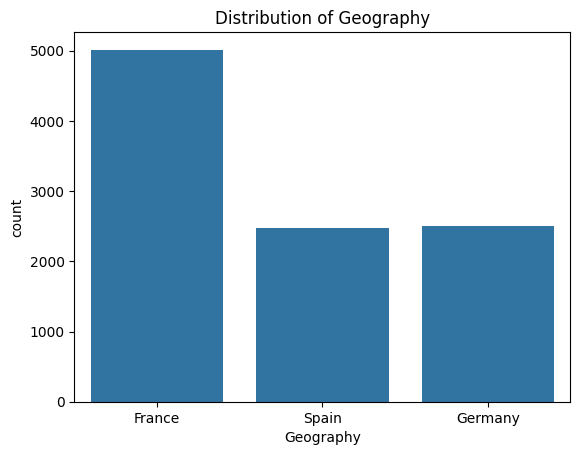

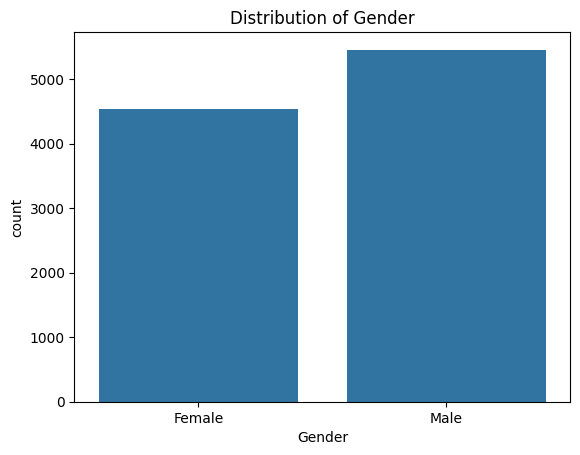

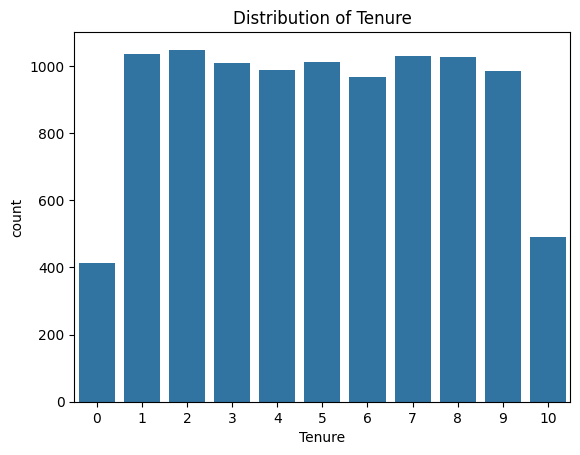

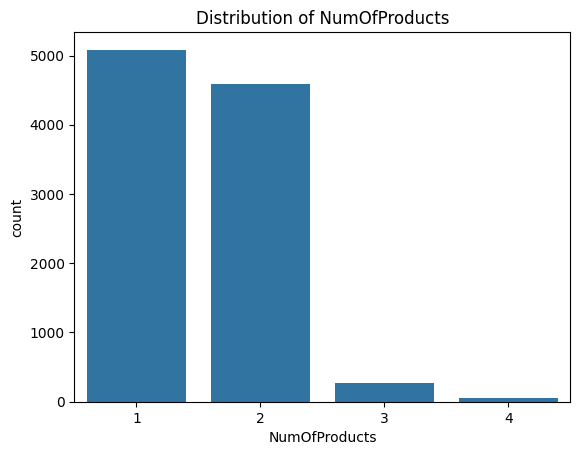

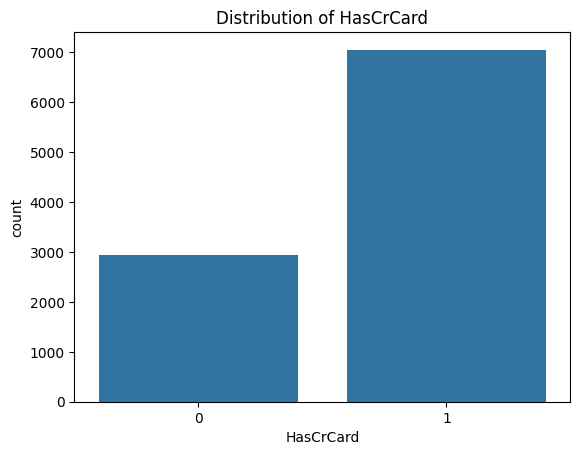

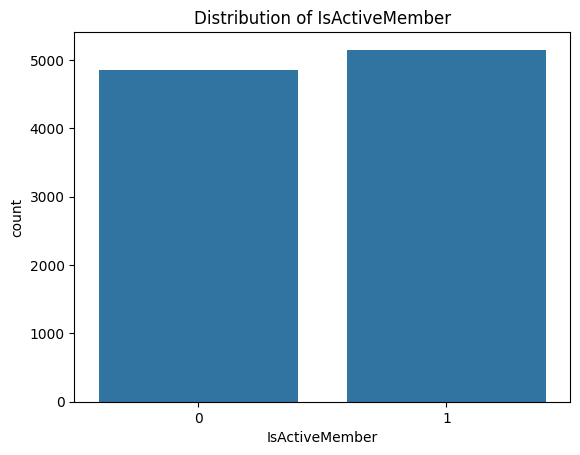

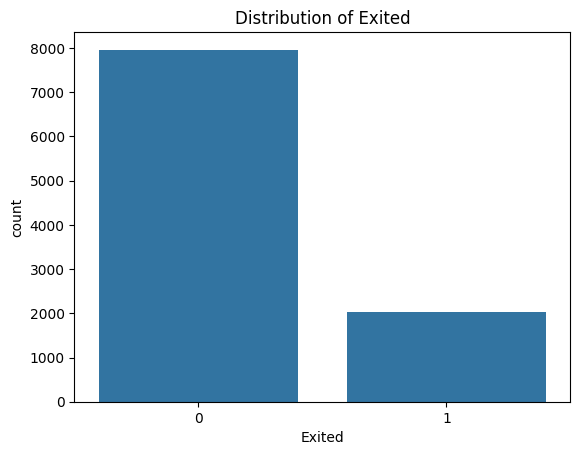

In [7]:
import matplotlib.pyplot as plt
for i in cat:
    plt.title(f'Distribution of {i}')
    sns.countplot(x = i, data = banks)
    plt.show()

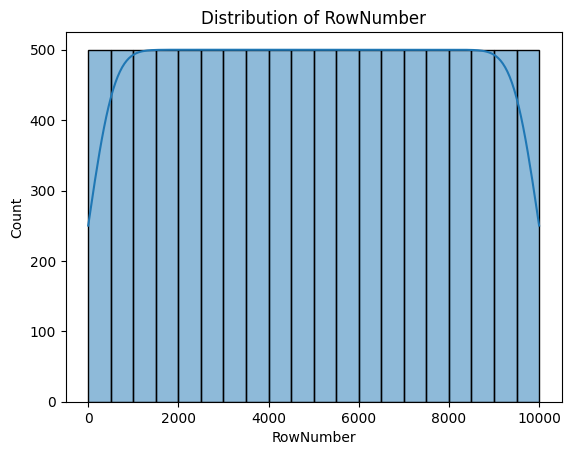

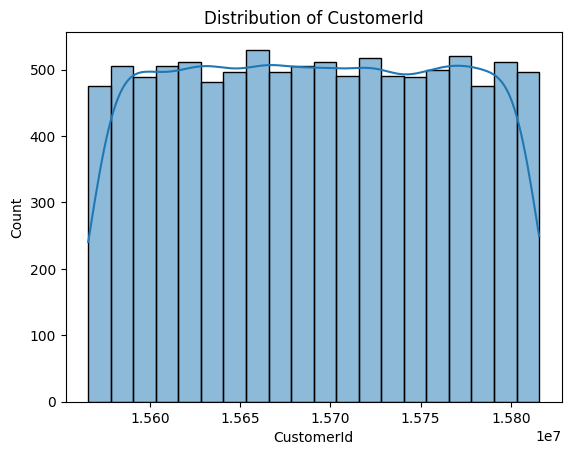

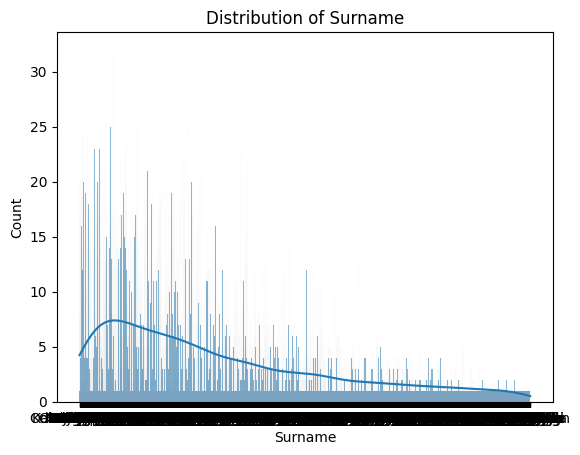

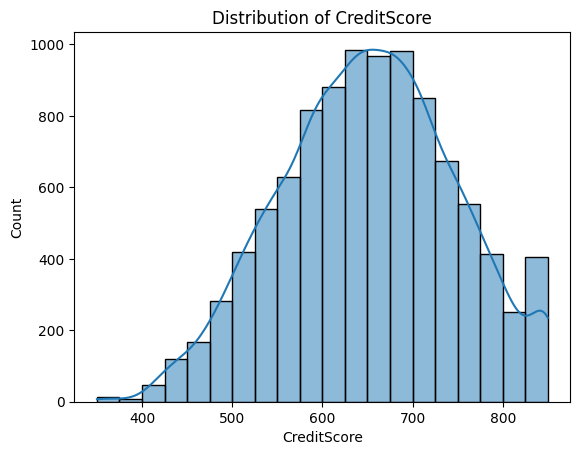

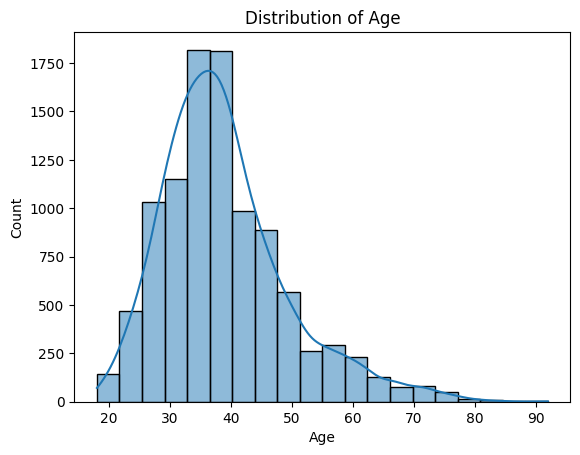

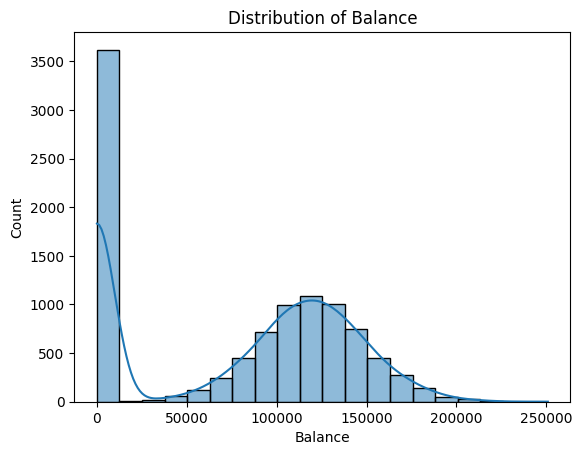

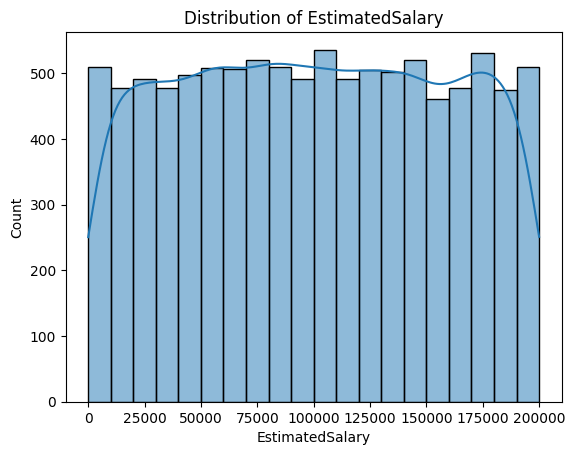

In [8]:
for i in num:
    plt.title(f'Distribution of {i}')
    sns.histplot(x = i, data = banks, bins = 20 , kde = True)
    plt.show()

In [9]:
 data = banks.drop(['CreditScore', 'CustomerId', 'RowNumber', 'Surname'], axis = 1)

<h1> transforming categorical variable to numerical </h1>

In [10]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
data['Geography'] = label_encoder.fit_transform(data[['Geography']])
data.head()

,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,Female,42,2,0.00,1,1,1,101348.88,1
1,2,Female,41,1,83807.86,1,0,1,112542.58,0
2,0,Female,42,8,159660.80,3,1,0,113931.57,1
3,0,Female,39,1,0.00,2,0,0,93826.63,0
4,2,Female,43,2,125510.82,1,1,1,79084.10,0


In [11]:
data['Gender'] = label_encoder.fit_transform(data[['Gender']])
data.head()

,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,0,42,2,0.00,1,1,1,101348.88,1
1,2,0,41,1,83807.86,1,0,1,112542.58,0
2,0,0,42,8,159660.80,3,1,0,113931.57,1
3,0,0,39,1,0.00,2,0,0,93826.63,0
4,2,0,43,2,125510.82,1,1,1,79084.10,0


In [12]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
for i in data.columns:
    data[i] = scaler.fit_transform(data[[i]])

In [13]:
x = data.drop(['Exited'], axis = 1)
y = data['Exited']

In [14]:
y = y.astype(int)

<h1> Feature selection </h1>

In [15]:
correlation_matrix = x.corr()

selected_features = correlation_matrix.iloc[:, 0].sort_values(ascending=False)[:6]

print(selected_features)

Geography         1.000000
Balance           0.069408
Age               0.022812
IsActiveMember    0.006724
Gender            0.004719
NumOfProducts     0.003972
Name: Geography, dtype: float64


In [16]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.2, random_state = 40)

In [17]:
!pip3 install xgboost
!pip3 install lightgbm
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score,precision_score, recall_score , f1_score , classification_report
import xgboost as xgb
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier


# Model Evaluations

In [18]:
data.head()

,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,-0.901886,-1.095988,0.293517,-1.041760,-1.225848,-0.911583,0.646092,0.970243,0.021886,1.977165
1,1.515067,-1.095988,0.198164,-1.387538,0.117350,-0.911583,-1.547768,0.970243,0.216534,-0.505775
2,-0.901886,-1.095988,0.293517,1.032908,1.333053,2.527057,0.646092,-1.030670,0.240687,1.977165
3,-0.901886,-1.095988,0.007457,-1.387538,-1.225848,0.807737,-1.547768,-1.030670,-0.108918,-0.505775
4,1.515067,-1.095988,0.388871,-1.041760,0.785728,-0.911583,0.646092,0.970243,-0.365276,-0.505775


In [19]:
models = {' Logistic Regression ' :LogisticRegression(),
          'Random Forest ': RandomForestClassifier(),
           'Support vector machine': SVC(), 
            'Xgboost ': xgb.XGBClassifier(), 
             'light gradient boost ': LGBMClassifier(verbose=0)}

import numpy as np
kf = KFold(n_splits=10, shuffle=True, random_state = 43)
for keys , values in models.items():
    
    cross_val_scores = cross_val_score(values, x, y , cv = kf)
    print(f'{keys} : {np.round(cross_val_scores,2)} ')
    print(" **** ")


 Logistic Regression  : [0.8  0.8  0.81 0.81 0.82 0.8  0.79 0.8  0.81 0.81] 
 **** 
Random Forest  : [0.87 0.85 0.86 0.86 0.85 0.85 0.86 0.84 0.86 0.87] 
 **** 
Support vector machine : [0.87 0.84 0.87 0.86 0.86 0.85 0.85 0.84 0.86 0.87] 
 **** 
Xgboost  : [0.85 0.85 0.87 0.86 0.85 0.84 0.85 0.84 0.86 0.87] 
 **** 
light gradient boost  : [0.86 0.85 0.86 0.87 0.86 0.86 0.86 0.84 0.86 0.88] 
 **** 


[LightGBM] [Info] Number of positive: 1625, number of negative: 6375
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 607
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.203125 -> initscore=-1.366876
[LightGBM] [Info] Start training from score -1.366876
[LightGBM] [Info] Number of positive: 1638, number of negative: 6362
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 606
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.204750 -> initscore=-1.356867
[LightGBM] [Info] Start training from score -1.356867
[LightGBM] [Info] Numb

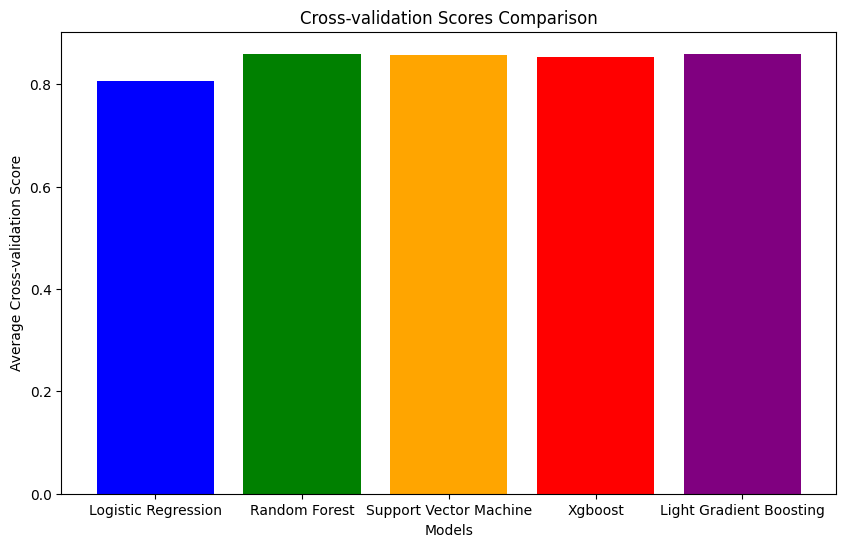

In [20]:
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'Support Vector Machine': SVC(),
    'Xgboost': xgb.XGBClassifier(),
    'Light Gradient Boosting': LGBMClassifier()
}

kf = KFold(n_splits=5, shuffle=True, random_state=43)

mean_scores = []

for model_name, model in models.items():
    fold_scores = cross_val_score(model, x, y, cv=kf)
    mean_scores.append(np.mean(fold_scores))

plt.figure(figsize=(10, 6))
plt.bar(models.keys(), mean_scores, color=['blue', 'green', 'orange', 'red', 'purple'])
plt.title('Cross-validation Scores Comparison')
plt.xlabel('Models')
plt.ylabel('Average Cross-validation Score')
plt.show()


In [21]:
kernals = ['linear','poly', 'rbf', 'sigmoid']
from sklearn.svm import SVC
for i in kernals:
    svm = SVC(kernel = i)
    svm.fit(xtrain, ytrain)
    print(i)
    print("training score : ", svm.score(xtrain,ytrain))
    print("testing score " ,svm.score(xtest,ytest))
    print(" ___ ")

linear
training score :  0.793375
testing score  0.808
 ___ 
poly
training score :  0.850875
testing score  0.8645
 ___ 
rbf
training score :  0.859
testing score  0.869
 ___ 
sigmoid
training score :  0.667
testing score  0.689
 ___ 


In [22]:
models = {' Logistic Regression ' :LogisticRegression(),
          'Random Forest ': RandomForestClassifier(),
           'Support vector machine': SVC(), 
            'Xgboost ': xgb.XGBClassifier(), 
          'Gradient Boost': GradientBoostingClassifier(),
             'light gradient boost ': LGBMClassifier(verbose=0)
            ,'KNeighbors Classifier ': KNeighborsClassifier(),
          'Decision tree': DecisionTreeClassifier()
         }

In [23]:
lgbm = LGBMClassifier(verbose=0)
lgbm.fit(xtrain,ytrain)
ypred = lgbm.predict(xtest)  
print(classification_report(ytest, ypred))

              precision    recall  f1-score   support

           0       0.90      0.96      0.93      1616
           1       0.75      0.56      0.64       384

    accuracy                           0.88      2000
   macro avg       0.83      0.76      0.79      2000
weighted avg       0.87      0.88      0.87      2000



In [24]:
print(confusion_matrix(ytest,ypred)) 
accuracy = accuracy_score(ytest, ypred)
precision = precision_score(ytest, ypred)
recall = recall_score(ytest, ypred)
f1 = f1_score(ytest, ypred)

print()
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


[[1544   72]
 [ 168  216]]

Accuracy: 0.88
Precision: 0.75
Recall: 0.5625
F1 Score: 0.6428571428571429


In [25]:
results = []

for model_name, model in models.items():
    model.fit(xtrain, ytrain)
    ypred = model.predict(xtest)
    acc = np.round(accuracy_score(ytest, ypred), 2)
    f1 = np.round(f1_score(ytest, ypred),2)
    prec = np.round(precision_score(ytest, ypred),2)
    rec = np.round(recall_score(ytest, ypred), 2)
     
    model_results = {
        'Model': model_name,
        'Accuracy': acc,
        'F1': f1,
        'Precision': prec,
        'Recall': rec
    }
    
    
    results.append(model_results)

model_results = pd.DataFrame(results)


In [26]:
model_results.head(10)

,Model,Accuracy,F1,Precision,Recall
0,Logistic Regression,0.82,0.31,0.61,0.20
1,Random Forest,0.87,0.60,0.73,0.51
2,Support vector machine,0.87,0.55,0.82,0.41
3,Xgboost,0.86,0.61,0.68,0.56
4,Gradient Boost,0.88,0.63,0.80,0.52
5,light gradient boost,0.88,0.64,0.75,0.56
6,KNeighbors Classifier,0.85,0.54,0.64,0.46
7,Decision tree,0.79,0.48,0.45,0.51


In [27]:
pip install --upgrade nbformat


Note: you may need to restart the kernel to use updated packages.


In [28]:
!pip3 install plotly
import plotly.express as px

fig = px.bar(model_results.melt(id_vars='Model'), x='Model', y='value', color='variable', barmode='group', 
             text='value', title='Model Performance Metrics Comparison',
             labels={'value': 'Score', 'variable': 'Metric'},
             height=600, width=1090)
fig.update_traces(textposition='outside')

fig.show()


In [29]:
for model_name, model in models.items():
    print(model_name)
    model.fit(xtrain, ytrain)
    print(f' Training accuracy : {model.score(xtrain,ytrain)}')
    print(f' Testing accuracy : {model.score(xtest,ytest)}')
    

 Logistic Regression 
 Training accuracy : 0.803375
 Testing accuracy : 0.8225
Random Forest 
 Training accuracy : 1.0
 Testing accuracy : 0.873
Support vector machine
 Training accuracy : 0.859
 Testing accuracy : 0.869
Xgboost 
 Training accuracy : 0.94225
 Testing accuracy : 0.865
Gradient Boost
 Training accuracy : 0.866
 Testing accuracy : 0.883
light gradient boost 
 Training accuracy : 0.9055
 Testing accuracy : 0.88
KNeighbors Classifier 
 Training accuracy : 0.878625
 Testing accuracy : 0.8475
Decision tree
 Training accuracy : 1.0
 Testing accuracy : 0.786


In [30]:
pip install imbalanced-learn


Note: you may need to restart the kernel to use updated packages.


In [31]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_res, Y_res = smote.fit_resample(x, y)

xtrain,xtest, ytrain, ytest = train_test_split(X_res, Y_res, train_size=0.70, random_state=43)
# for model_name, model in models.items():
#     print(model_name)
#     model.fit(xtrain_resampled, ytrain_resampled)
#     print(f' Training accuracy : {model.score(xtrain_resampled,ytrain_resampled)}')
#     print(f' Testing accuracy : {model.score(xtest,ytest)}')
    
    

In [32]:
Y_res.value_counts()

Exited
1    7963
0    7963
Name: count, dtype: int64

In [33]:
print("after balancing data")

results = []

for model_name, model in models.items():
    model.fit(xtrain, ytrain)
    ypred = model.predict(xtest)
    acc = np.round(accuracy_score(ytest, ypred), 2)
    f1 = np.round(f1_score(ytest, ypred),2)
    prec = np.round(precision_score(ytest, ypred),2)
    rec = np.round(recall_score(ytest, ypred), 2)
     
    model_results = {
        'Model': model_name,
        'Accuracy': acc,
        'F1': f1,
        'Precision': prec,
        'Recall': rec
    }
    
    
    results.append(model_results)

model_results = pd.DataFrame(results)


after balancing data


In [34]:
model_results.head(10)

,Model,Accuracy,F1,Precision,Recall
0,Logistic Regression,0.71,0.70,0.71,0.70
1,Random Forest,0.89,0.89,0.89,0.89
2,Support vector machine,0.80,0.80,0.80,0.80
3,Xgboost,0.90,0.90,0.92,0.88
4,Gradient Boost,0.85,0.85,0.85,0.86
5,light gradient boost,0.90,0.90,0.92,0.89
6,KNeighbors Classifier,0.84,0.85,0.80,0.91
7,Decision tree,0.84,0.84,0.83,0.86


In [35]:

fig = px.bar(model_results.melt(id_vars='Model'), x='Model', y='value', color='variable', barmode='group', 
             text='value', title='Model Performance Metrics Comparison',
             labels={'value': 'Score', 'variable': 'Metric'},
             height=600, width=1090)

fig.update_traces(textposition='outside')


fig.show()

In [36]:
from sklearn.model_selection import GridSearchCV
 
param = {
    'num_leaves': [30, 50, 100],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [5, 10, 15],
    'min_child_samples': [20, 50, 100],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'verbose':[0]
}

best_hyp = GridSearchCV(estimator=lgbm, param_grid=param, cv = 5, scoring = 'accuracy')
best_hyp.fit(xtrain,ytrain)

print("best hyperparameters : ",best_hyp.best_params_)
print('Best score : ', best_hyp.best_score_)

print(f'test score : {best_hyp.score(xtest,ytest)}')

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [37]:
tuned_lgbm = LGBMClassifier(verbose=0,colsample_bytree = 0.8, learning_rate = 0.1, max_depth = 15, min_child_samples= 50, num_leaves = 100, subsample = 0.8)
tuned_lgbm.fit(xtrain, ytrain)
ypred = tuned_lgbm.predict(xtest)
accuracy = accuracy_score(ytest, ypred)
precision = precision_score(ytest, ypred)
recall = recall_score(ytest, ypred)
f1 = f1_score(ytest, ypred)

print()
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [38]:
 import joblib

In [39]:
 joblib.dump(tuned_lgbm, 'churn_predict_model')

['churn_predict_model']

In [40]:
 model = joblib.load('churn_predict_model')

In [41]:
data.columns

Index(['Geography', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts',
       'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [42]:
model.predict([[1,0,34,2,343,0,0,1,23000.34]])

array([0])

In [43]:

from sklearn.preprocessing import StandardScaler

import joblib

In [44]:
import tkinter as tk
from tkinter import ttk
from sklearn.preprocessing import LabelEncoder
 
geography_encoder = LabelEncoder()
gender_encoder = LabelEncoder()

def get_prediction():
     
    geography = entry_vars['Geography'].get()
    gender = entry_vars['Gender'].get()
    age = entry_vars['Age'].get()
    tenure = entry_vars['Tenure'].get()
    balance = entry_vars['Balance'].get()
    num_of_products = entry_vars['NumOfProducts'].get()
    has_cr_card = entry_vars['HasCrCard'].get()
    is_active_member = entry_vars['IsActiveMember'].get()
    estimated_salary = entry_vars['EstimatedSalary'].get()
 
    geography_encoded = geography_encoder.fit_transform([geography])[0]
    gender_encoded = gender_encoder.fit_transform([gender])[0]
 
    features = [geography_encoded, gender_encoded, int(age), int(tenure), float(balance), int(num_of_products), int(has_cr_card), int(is_active_member), float(estimated_salary)]
    prediction = model.predict([features])[0]
 
    result_label.config(text=f"Prediction: {'Exited' if prediction == 1 else 'Not Exited'}")

window = tk.Tk()
window.title("Customer Exit Prediction")

labels = ['Geography', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary']
entry_vars = {}

for i, label in enumerate(labels):
    ttk.Label(window, text=f"{label}:").grid(row=i, column=0, padx=10, pady=5)
    entry_var = tk.StringVar()
    entry_widget = ttk.Entry(window, textvariable=entry_var)
    entry_widget.grid(row=i, column=1, padx=10, pady=5)
    entry_vars[label] = entry_var

predict_button = ttk.Button(window, text="Predict", command=get_prediction)
predict_button.grid(row=len(labels), column=0, columnspan=2, pady=10)

result_label = ttk.Label(window, text="")
result_label.grid(row=len(labels) + 1, column=0, columnspan=2, pady=5)

window.mainloop()
